In this demo, we provide an example on how G-SAN can be used for stain augmentation and stain normalization.

First, load the pre-trained G-SAN generator model:

In [18]:
%matplotlib inline
import torch
import numpy as np
import importlib
import random
from skimage import io
from collections import OrderedDict

from gsan.gsan import GSAN
from gsan.utils.misc import to_cuda
from gsan.utils.fdlutils import pad_nd_image, quick_imshow
from gsan.utils.visualization import tensor2im

weight_path = 'assets/weights.pt'

# # Prepare GAN
net_G = GSAN(K=3).to('cuda')
weights = torch.load(weight_path)

net_G.load_state_dict(weights)
net_G.eval()
for p in net_G.parameters():
    p.requires_grad = False


def imread_with_pad(fn):
    # channel last, 0 to 1
    img = io.imread(fn)
    img = img.astype(np.float32) / 255.0
    img = img[..., :3]
    # Pad the image to a minimal size
    new_shape = (max(256, img.shape[0]), max(256, img.shape[1]))
    img, slicer = pad_nd_image(
        img.transpose(2, 0, 1), new_shape, mode='constant',
        kwargs={'constant_values': 1.0}, shape_must_be_divisible_by=16, return_slicer=True)
    return img, [slicer[1], slicer[2], slicer[0]]


print("Loading successful!")


Loading successful!


Augment a cell image with random stains:

<ipython-input-19-e472ab561ddf>:16: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output_imgs = [p[slicer] for p in output_imgs]


(<Figure size 5000x1250 with 4 Axes>,
 array([<AxesSubplot:title={'center':'Original'}>,
        <AxesSubplot:title={'center':'Random'}>,
        <AxesSubplot:title={'center':'Random'}>,
        <AxesSubplot:title={'center':'Random'}>], dtype=object),
 (<matplotlib.image.AxesImage at 0x7f1b14051c70>,
  <matplotlib.image.AxesImage at 0x7f1b14043f10>))

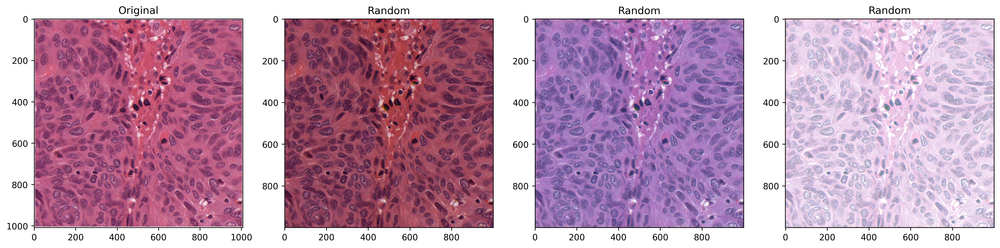

In [19]:
img_path = f'assets/{random.randint(1, 10)}.png'

# G-SAN expects (b, c, w, h), 0 to 1
input_img, slicer = imread_with_pad(img_path)
# Repeat a couple times
n = 4
x = np.repeat(input_img[np.newaxis], 4, axis=0)
x = to_cuda(torch.from_numpy(x))

with torch.no_grad():
    outputs_x = net_G.encode(x)
    outputs_x['sty'] = torch.randn_like(outputs_x['sty'])
    y = net_G.decode(outputs_x)

output_imgs = tensor2im(y, normalize=False)
output_imgs = [p[slicer] for p in output_imgs]

quick_imshow(1, n, [input_img.transpose(1, 2, 0)] + output_imgs, colorbar=False,
              titles=['Original'] + ['Random'] * n)


Stain normalization: combine a morphology reference image and a stain reference image.

<ipython-input-24-d6242746ca42>:25: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output_imgs = [p[slicer] for p in output_imgs]


(<Figure size 3750x1250 with 3 Axes>,
 array([<AxesSubplot:title={'center':'Morphology Ref.'}>,
        <AxesSubplot:title={'center':'Stain Ref.'}>,
        <AxesSubplot:title={'center':'Output'}>], dtype=object),
 (<matplotlib.image.AxesImage at 0x7f1afc71f520>,
  <matplotlib.image.AxesImage at 0x7f1afc71fd60>))

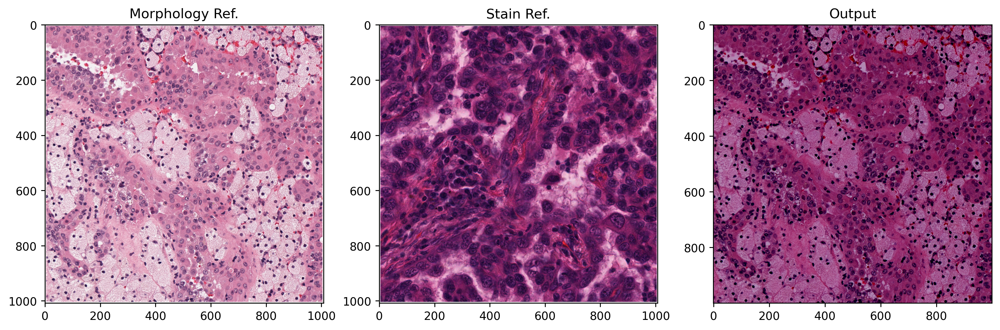

In [24]:
img_path = f'assets/{random.randint(1, 10)}.png'
ref_path = f'assets/{random.randint(1, 10)}.png'

input_img, slicer = imread_with_pad(img_path)
x = torch.from_numpy(input_img[np.newaxis])
x = to_cuda(x)

ref_img, _ = imread_with_pad(ref_path)
r = torch.from_numpy(ref_img[np.newaxis])
r = to_cuda(r)

with torch.no_grad():
    # Encode content from input
    outputs_x = net_G.encode(x)

    # Encode stain from ref
    outputs_r = net_G.encode(r)

    # Combine content and style
    inputs_y = outputs_x
    inputs_y['sty'] = outputs_r['sty']
    y = net_G.decode(inputs_y)

output_imgs = tensor2im(y, normalize=False)
output_imgs = [p[slicer] for p in output_imgs]

quick_imshow(1, 3, [input_img.transpose(1, 2, 0), ref_img.transpose(1, 2, 0)] + output_imgs, colorbar=False,
             titles=['Morphology Ref.', 'Stain Ref.', 'Output'])
